<a>https://www.kaggle.com/code/shiviyadav/customer-churn-prediction-eda-ml-techniques/notebook</a>

<H1><b>About Dataset</b></H1>
<p>A manager at the bank is disturbed with more and more customers leaving their credit card services. They would really appreciate if one could predict for them who is going to get churned so they can proactively go to the customer to provide them better services and turn customers' decisions in the opposite direction.</p>

<p>Now, this dataset consists of 10,000 customers mentioning their age, salary, marital_status, credit card limit, credit card category, etc.</p>

<p>We have only 16.07% of customers who have churned. Thus, it's a bit difficult to train our model to predict churning customers.</p>

<b>PLEASE IGNORE THE LAST 2 COLUMNS (NAIVE BAYES CLAS…). I SUGGEST TO RATHER DELETE IT BEFORE DOING ANYTHING</b>

<p>A business manager of a consumer credit card portfolio is facing the problem of customer attrition. They want to analyze the data to find out the reason behind this and leverage the same to predict customers who are likely to drop off.</p>

<H2><b>Columns</H2></b>

C = Categorical

N = Numerical

**CLIENTNUM**
Client number. Unique identifier for the customer holding the account

(C) **Attrition_Flag**
Internal event (customer activity) variable - if the account is closed then 1 else 0

(N) **Customer_Age**
Demographic variable - Customer's Age in Years

(C) **Gender**
Demographic variable - M=Male, F=Female

(N) **Dependent_count**
Demographic variable - Number of dependents (someone who depends on you for financial support, for example, a child or family member who cannot work`)

(C) **Education_Level**
Demographic variable - Educational Qualification of the account holder ['High School', 'Graduate', 'Uneducated', 'Unknown', 'College', 'Post-Graduate', 'Doctorate']

(C) **Marital_Status**
Demographic variable - Married, Single, Divorced, Unknown

(C) **Income_Category**
Demographic variable - Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, > $120K, Unknown)

(C) **Card_Category**
Product Variable - Type of Card (Blue, Silver, Gold, Platinum)

(N) **Months_on_book**
Period of relationship with bank

(N) **Total_Relationship_Count**
Total no. of products held by the customer

(N) **Months_Inactive_12_mon**
No. of months inactive in the last 12 months

(N) **Contacts_Count_12_mon**
No. of Contacts in the last 12 months

(N) **Credit_Limit**
Credit Limit on the Credit Card

(N) **Total_Revolving_Bal**
Total Revolving Balance on the Credit Card. In credit card terms, a revolving balance is the portion of credit card spending that goes unpaid at the end of a billing cycle. The amount can vary, going up or down depending on the amount borrowed and the amount repaid. If you revolve a balance — that is, not pay it off at the end of the month — the lender will charge you for the privilege of borrowing their money. The amount of the charge for revolving a balance will depend on the size of the balance and the interest rate of the card. When the balance is paid off, the customer is no longer revolving the debt.

(N) **Avg_Open_To_Buy**
Open to Buy Credit Line (Average of last 12 months)

(N) **Total_Amt_Chng_Q4_Q1**
Change in Transaction Amount (Q4 over Q1)

(N) **Total_Trans_Amt**
Total Transaction Amount (Last 12 months)

(N) **Total_Trans_Ct**
Total Transaction Count (Last 12 months)

(N) **Total_Ct_Chng_Q4_Q1**
Change in Transaction Count (Q4 over Q1)

(N) **Avg_Utilization_Ratio**
Average Card Utilization Ratio

---

# <H2><b>Preparing my dataframe</H2></b>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
from google.colab import auth
import gspread
from google.auth import default
#autenticating to google
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

In [ ]:
#defining my worksheet
worksheet = gc.open('BankChurners').sheet1
#get_all_values gives a list of rows
rows = worksheet.get_all_values()
#Convert to a DataFrame 
df = pd.DataFrame(rows)
#creating columns name
df.columns = df.iloc[0]
df = df.iloc[1:]

Dropping the last two columns and the first one becouse they are useless.

In [ ]:
df = df.iloc[:,1:-2]

# <H2><b>Analising my dataframe</H2></b>

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object', name=0)

In [ ]:
df.shape

(10127, 20)

In [ ]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691,777,11914,1.335,1144,42,1.625,61
2,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256,864,7392,1.541,1291,33,3.714,105
3,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418,0,3418,2.594,1887,20,2.333,0
4,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313,2517,796,1.405,1171,20,2.333,0.76
5,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716,0,4716,2.175,816,28,2.5,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 1 to 10127
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Attrition_Flag            10127 non-null  object
 1   Customer_Age              10127 non-null  object
 2   Gender                    10127 non-null  object
 3   Dependent_count           10127 non-null  object
 4   Education_Level           10127 non-null  object
 5   Marital_Status            10127 non-null  object
 6   Income_Category           10127 non-null  object
 7   Card_Category             10127 non-null  object
 8   Months_on_book            10127 non-null  object
 9   Total_Relationship_Count  10127 non-null  object
 10  Months_Inactive_12_mon    10127 non-null  object
 11  Contacts_Count_12_mon     10127 non-null  object
 12  Credit_Limit              10127 non-null  object
 13  Total_Revolving_Bal       10127 non-null  object
 14  Avg_Open_To_Buy       

In [ ]:
df = df.astype({'Attrition_Flag':'object', 
        'Customer_Age':'int64', 
        'Gender':'object', 
        'Dependent_count':'int64',
        'Education_Level':'object', 
        'Marital_Status':'object', 
        'Income_Category':'object', 
        'Card_Category':'object',
        'Months_on_book':'int64', 
        'Total_Relationship_Count':'int64', 
        'Months_Inactive_12_mon':'int64',
        'Contacts_Count_12_mon':'int64', 
        'Credit_Limit':'float64', 
        'Total_Revolving_Bal':'float64',
        'Avg_Open_To_Buy':'float64', 
        'Total_Amt_Chng_Q4_Q1':'float64', 
        'Total_Trans_Amt':'float64',
        'Total_Trans_Ct':'float64', 
        'Total_Ct_Chng_Q4_Q1':'float64', 
        'Avg_Utilization_Ratio':'float64'})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 1 to 10127
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  float64
 14  Avg_Op

In [ ]:
def missing_data(df):
    total = df.isnull().sum().sort_values(ascending = False)
    Percentage = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, Percentage], axis=1, keys=['Total', 'Percentage'])

missing_data(df)

,Total,Percentage
0,,
Attrition_Flag,0,0.0
Customer_Age,0,0.0
Total_Ct_Chng_Q4_Q1,0,0.0
Total_Trans_Ct,0,0.0
Total_Trans_Amt,0,0.0
Total_Amt_Chng_Q4_Q1,0,0.0
Avg_Open_To_Buy,0,0.0
Total_Revolving_Bal,0,0.0
Credit_Limit,0,0.0


In [ ]:
df[['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']].nunique()

0
Attrition_Flag     2
Gender             2
Education_Level    7
Marital_Status     4
Income_Category    6
Card_Category      4
dtype: int64

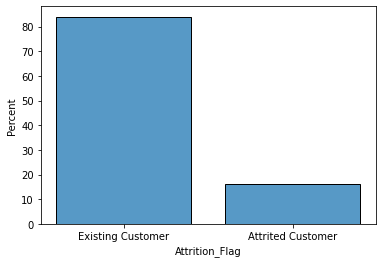

In [ ]:
sns.histplot(x='Attrition_Flag',data=df, stat="percent", discrete=True, shrink=.8)

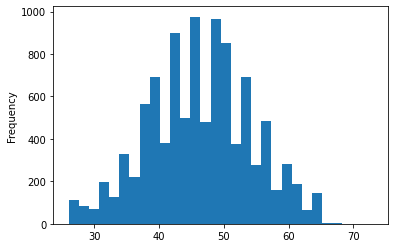

In [ ]:
pd.to_numeric(df['Customer_Age']).plot.hist(bins=30)

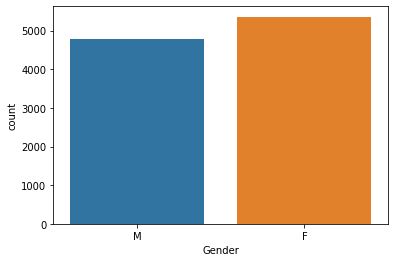

In [ ]:
sns.countplot(x='Gender', data=df)

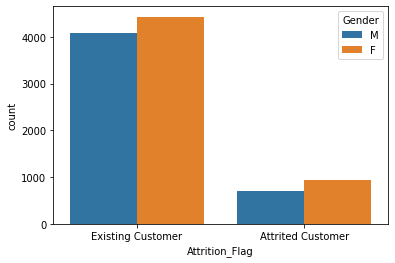

In [ ]:
sns.countplot(hue='Gender',data=df,x='Attrition_Flag')

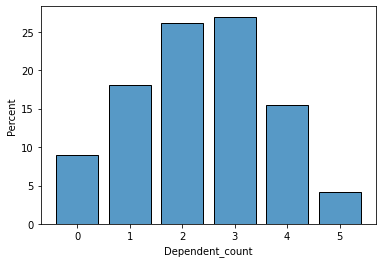

In [ ]:
sns.histplot(x='Dependent_count',data=df, stat="percent", discrete=True, shrink=.8)

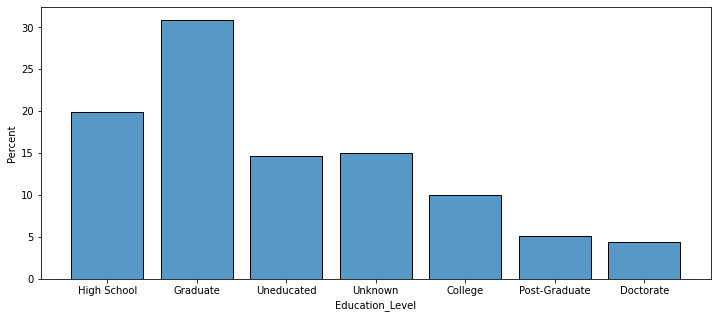

In [ ]:
plt.figure(figsize=(12,5))
sns.histplot(x='Education_Level',data=df, stat="percent", discrete=True, shrink=.8)

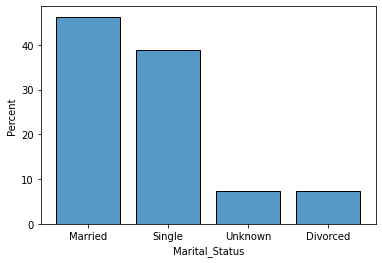

In [ ]:
sns.histplot(x='Marital_Status',data=df, stat="percent", discrete=True, shrink=.8)

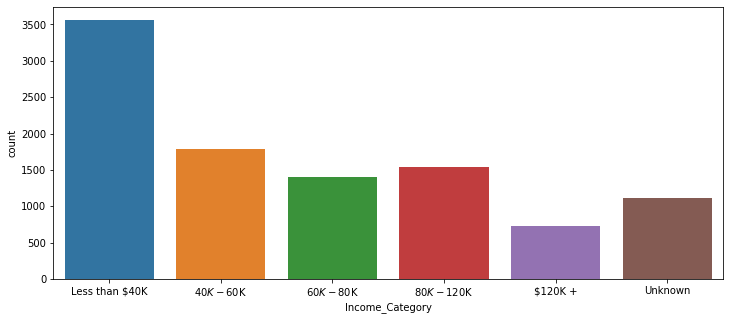

In [ ]:
plt.figure(figsize=(12,5))
sns.countplot(x='Income_Category',data=df,order=['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K','$120K +', 'Unknown'])

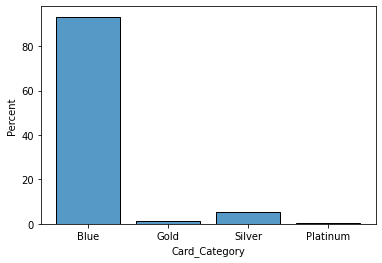

In [ ]:
sns.histplot(x='Card_Category',data=df, stat="percent", discrete=True, shrink=.8)

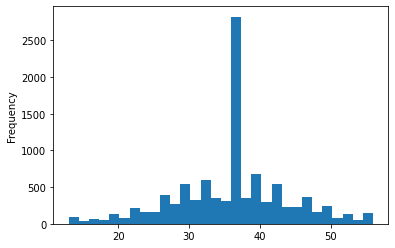

In [ ]:
pd.to_numeric(df['Months_on_book']).plot.hist(bins=30)

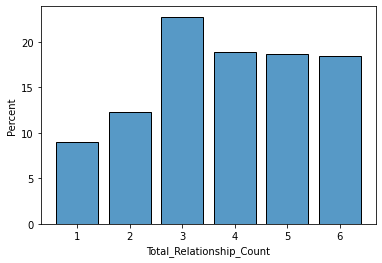

In [ ]:
sns.histplot(x='Total_Relationship_Count',data=df, stat="percent", discrete=True, shrink=.8)

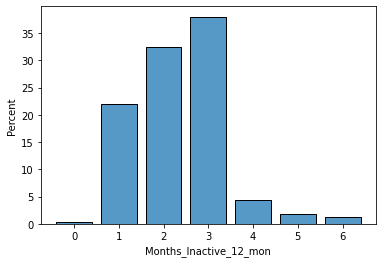

In [ ]:
sns.histplot(x='Months_Inactive_12_mon',data=df, stat="percent", discrete=True, shrink=.8)

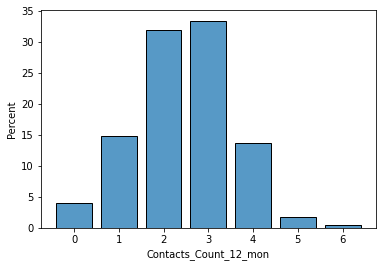

In [ ]:
sns.histplot(x='Contacts_Count_12_mon',data=df, stat="percent", discrete=True, shrink=.8)

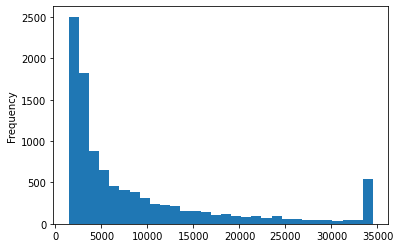

In [ ]:
pd.to_numeric(df['Credit_Limit']).plot.hist(bins=30)

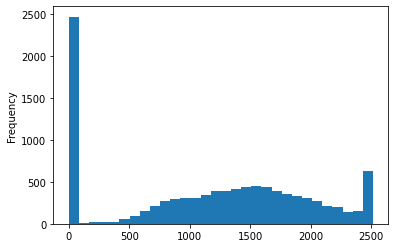

In [ ]:
pd.to_numeric(df['Total_Revolving_Bal']).plot.hist(bins=30)

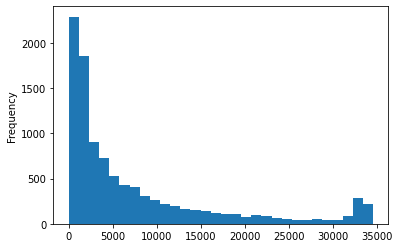

In [ ]:
pd.to_numeric(df['Avg_Open_To_Buy']).plot.hist(bins=30)

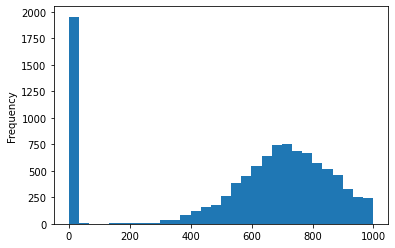

In [ ]:
pd.to_numeric(df['Total_Amt_Chng_Q4_Q1']).plot.hist(bins=30)

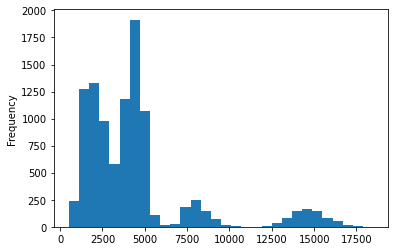

In [ ]:
pd.to_numeric(df['Total_Trans_Amt']).plot.hist(bins=30)

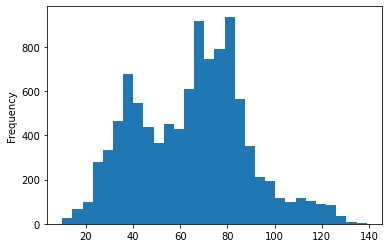

In [ ]:
pd.to_numeric(df['Total_Trans_Ct']).plot.hist(bins=30)

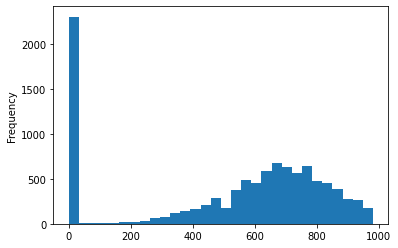

In [ ]:
pd.to_numeric(df['Total_Ct_Chng_Q4_Q1']).plot.hist(bins=30)

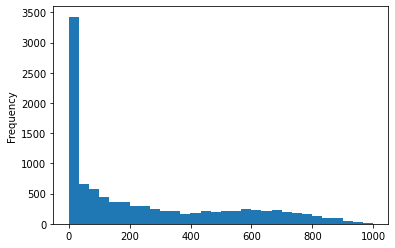

In [ ]:
pd.to_numeric(df['Avg_Utilization_Ratio']).plot.hist(bins=30)

<H2><b>Observations:</b></H2>

<p>1- We have 6 columns as categorical. We will have to apply an encoding named OneHotEncoder because there are less than 15 columns.</p>
<p>2- We don't know what Q1 and Q4 mean over 'Total_Amt_Chng_Q4_Q1' and 'Total_Ct_Chng_Q4_Q1'. So we will assume they are the rate between the past and current quater.</p>
<p>3- We haven't duplicated or null values.</p>
<p>4- As we were informed, 'Attrition_Flag' is unbalaced. This can be a problem to our prediction. => We will have to analysis some relationship filtering by 'Attrited Customer' with the other columns to understand better what to do.</p>
<p>5- 'Card_Category' is unbalanced. More than 90% is 'Blue', and from my point of view this data don't help us. => We will drop it.</p>
<p>6- These columns have a different distributions with outliers some of them, and high values. It is better to normalize all of them. => We will apply for almost all of them 'Robust Scaler'.</p>
<p>7- 'Marital_Status' we have around of 8% of 'unknown' data. We have the following options: a) ignore them; b) drop them; c) try to complete them using statistics predictions.=> We will drop it because we continue with a good amount of data.</p>
<p>8- 'Income_Category' we have around of 1-2% of 'unknown' data. => We will drop them because are insignificant.</p>
<p>9- 'Education_Level' has around a 15% of 'unknown' value. => We will do nothing and continue with it.
<p>10- 'Customer_Age' is the only column that it has to apply a frecuency distribution. This is because datum per datum inside it doesn't give any importance value.</p>

<H2><b>Dropping 'Card_Category' column</b></H2>
<H2><b>Dropping 'unknown' data from 'Marital_Status'</b></H2>
<H2><b>Dropping 'unknown' data from 'Income_Category'</b></H2>

In [ ]:
df.drop('Card_Category', axis=1, inplace= True)

indexDrop = df[ (df['Marital_Status'] == 'Unknown') | (df['Income_Category'] == 'Unknown') ].index
df.drop(indexDrop, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8348 entries, 1 to 10127
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            8348 non-null   object 
 1   Customer_Age              8348 non-null   int64  
 2   Gender                    8348 non-null   object 
 3   Dependent_count           8348 non-null   int64  
 4   Education_Level           8348 non-null   object 
 5   Marital_Status            8348 non-null   object 
 6   Income_Category           8348 non-null   object 
 7   Months_on_book            8348 non-null   int64  
 8   Total_Relationship_Count  8348 non-null   int64  
 9   Months_Inactive_12_mon    8348 non-null   int64  
 10  Contacts_Count_12_mon     8348 non-null   int64  
 11  Credit_Limit              8348 non-null   float64
 12  Total_Revolving_Bal       8348 non-null   float64
 13  Avg_Open_To_Buy           8348 non-null   float64
 14  Total_A

In [ ]:
df = df.reset_index(drop=True)

---
<H2><b>'Customer_Age' to frecuency distribution</b></H2>
<p>Adulthood is usually divided into several periods: young or early adulthood (approximately aged 20–39), middle adulthood (40–59), and old age (60+). Old age is typically divided into the periods of young old (60–75) and old old (75 and up).</p>
<small>"Adult Development, Psychology of"
M.E. Lachman, in International Encyclopedia of the Social & Behavioral Sciences, 2001</small>

In [ ]:
df['Adulthood'] = ''
df.loc[(df['Customer_Age']>20) & (df['Customer_Age']<=39),'Adulthood'] = 'early_adulthood'
df.loc[(df['Customer_Age']>39) & (df['Customer_Age']<=59),'Adulthood'] = 'middle_adulthood'
df.loc[(df['Customer_Age']>59) & (df['Customer_Age']<=75),'Adulthood'] = 'young_old'
df.loc[df['Customer_Age']>75,'Adulthood'] = 'old_old'
df.astype({'Adulthood':'object'})
df['Adulthood'].value_counts()

middle_adulthood    6223
early_adulthood     1697
young_old            428
Name: Adulthood, dtype: int64

In [ ]:
df.drop('Customer_Age', axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8348 entries, 0 to 8347
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            8348 non-null   object 
 1   Gender                    8348 non-null   object 
 2   Dependent_count           8348 non-null   int64  
 3   Education_Level           8348 non-null   object 
 4   Marital_Status            8348 non-null   object 
 5   Income_Category           8348 non-null   object 
 6   Months_on_book            8348 non-null   int64  
 7   Total_Relationship_Count  8348 non-null   int64  
 8   Months_Inactive_12_mon    8348 non-null   int64  
 9   Contacts_Count_12_mon     8348 non-null   int64  
 10  Credit_Limit              8348 non-null   float64
 11  Total_Revolving_Bal       8348 non-null   float64
 12  Avg_Open_To_Buy           8348 non-null   float64
 13  Total_Amt_Chng_Q4_Q1      8348 non-null   float64
 14  Total_Tr

---
# <H2><b>Statistics analysis.</H2></b>

In [ ]:
def describe(df, stats):
    d = df.describe(exclude = 'object')
    return d.append(df.reindex(d.columns, axis = 1).agg(stats))

describe(df, ['skew', 'median', 'var']).transpose()[['count', 'mean', 'median', 'skew', 'std', 'min', 'max', '25%', '50%', '75%']]

,count,mean,median,skew,std,min,max,25%,50%,75%
0,,,,,,,,,,
Dependent_count,8348.0,2.340201,2.0,-0.011414,1.297205,0.0,5.0,1.00,2.0,3.00
Months_on_book,8348.0,35.988021,36.0,-0.083274,7.984266,13.0,56.0,31.00,36.0,40.00
Total_Relationship_Count,8348.0,3.816004,4.0,-0.167312,1.548984,1.0,6.0,3.00,4.0,5.00
Months_Inactive_12_mon,8348.0,2.338404,2.0,0.616849,1.002155,0.0,6.0,2.00,2.0,3.00
Contacts_Count_12_mon,8348.0,2.458553,2.0,-0.006551,1.111743,0.0,6.0,2.00,2.0,3.00
Credit_Limit,8348.0,8455.716507,4267.5,1.710809,9094.793763,1438.3,34516.0,2492.00,4267.5,10683.50
Total_Revolving_Bal,8348.0,1168.997365,1281.0,-0.155592,813.074608,0.0,2517.0,468.00,1281.0,1784.00
Avg_Open_To_Buy,8348.0,7286.719142,3228.5,1.706902,9094.525176,3.0,34516.0,1228.75,3228.5,9455.75
Total_Amt_Chng_Q4_Q1,8348.0,571.726858,673.0,-0.929644,310.830864,0.0,999.0,479.00,673.0,789.00


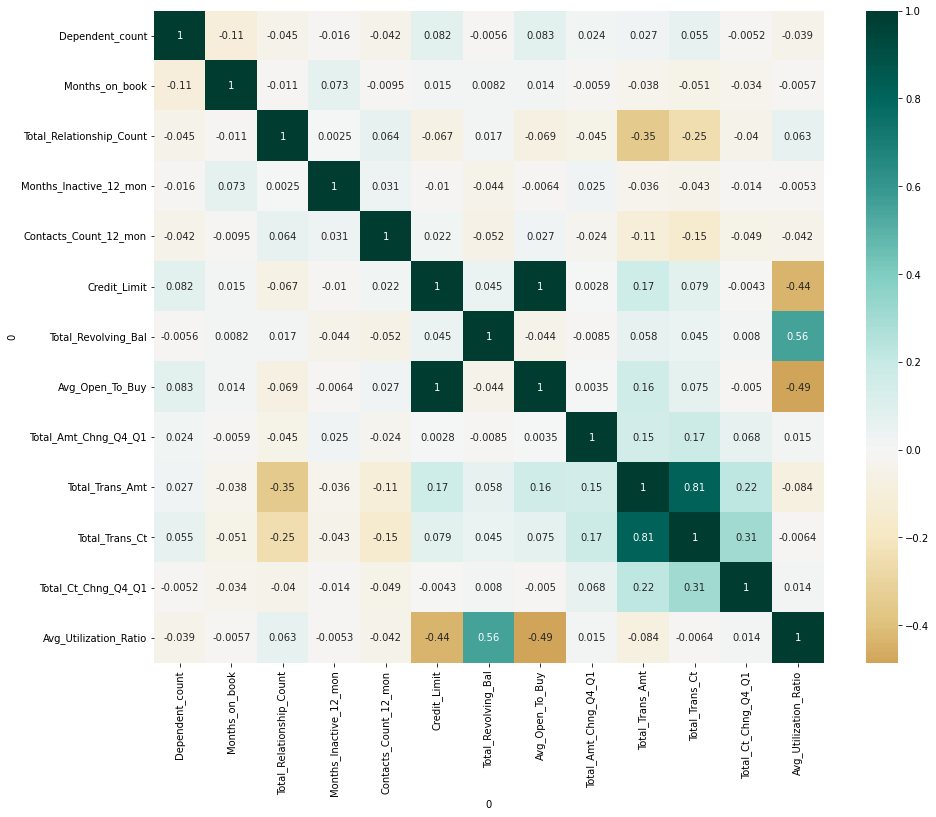

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(df.corr(), annot=True, cmap="BrBG",center=0)

<H2><b>Observations:</b></H2>
<p>1- Looking at the central tendecy, asymmetry and variability we can conclude that some of our data have important outliers and tails (representing how much we are closed or not to a normal distribution). This is important when we have to choose what kind of technique we have to apply to normalize. To be consistent all of them will be applied by 'Robust Scaler'. After this, we can analize again to look them normalized.</p>
<p>2- The correlation between all numerical columns shows that some of them have good relationship (positive or negative). However, columns are closed to 0 and we can avoid them. They are: 'Dependent_count', 'Months_on_book' and 'Months_Inactive_12_mon'.</p>
<br>
<p><i>NOTE: these conclusions are over all the dataset, but we have to remember we need to know why more and more customers leaving the credit card services. For that reason, we will do the same analysis but filtering 'Attrition_Flag' to know more about it.</i></p>

## <H2><b>Analising dataframe filtering 'Attrition_Flag' = 'Attrited Customer'</b></H2>

In [ ]:
df['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [ ]:
df_AC = df[df['Attrition_Flag']=='Attrited Customer'].copy(deep=True)
df_EC = df[df['Attrition_Flag']=='Existing Customer'].copy(deep=True)

In [ ]:
def describe(df, stats):
    d = df.describe(exclude = 'object')
    return d.append(df.reindex(d.columns, axis = 1).agg(stats))

describe(df_AC, ['skew', 'median', 'var']).transpose()[['count', 'mean', 'median', 'skew', 'std', 'min', 'max', '25%', '50%', '75%']]

,count,mean,median,skew,std,min,max,25%,50%,75%
0,,,,,,,,,,
Dependent_count,1328.0,2.396837,2.0,-0.102216,1.281680,0.0,5.0,1.00,2.0,3.00
Months_on_book,1328.0,36.094880,36.0,-0.146753,7.742563,13.0,56.0,32.00,36.0,40.00
Total_Relationship_Count,1328.0,3.284639,3.0,0.269833,1.585163,1.0,6.0,2.00,3.0,5.00
Months_Inactive_12_mon,1328.0,2.690512,3.0,0.352306,0.885196,0.0,6.0,2.00,3.0,3.00
Contacts_Count_12_mon,1328.0,2.971386,3.0,0.386608,1.088722,0.0,6.0,2.00,3.0,4.00
Credit_Limit,1328.0,8073.081551,4080.0,1.804738,9140.891546,1438.3,34516.0,2032.50,4080.0,9905.25
Total_Revolving_Bal,1328.0,672.380271,0.0,1.029745,923.388358,0.0,2517.0,0.00,0.0,1299.25
Avg_Open_To_Buy,1328.0,7400.701280,3400.0,1.801135,9144.697797,3.0,34516.0,1565.50,3400.0,9127.50
Total_Amt_Chng_Q4_Q1,1328.0,545.224797,619.0,-0.665612,306.049490,0.0,999.0,394.75,619.0,777.00


In [ ]:
def describe(df, stats):
    d = df.describe(exclude = 'object')
    return d.append(df.reindex(d.columns, axis = 1).agg(stats))

describe(df_EC, ['skew', 'median', 'var']).transpose()[['count', 'mean', 'median', 'skew', 'std', 'min', 'max', '25%', '50%', '75%']]

,count,mean,median,skew,std,min,max,25%,50%,75%
0,,,,,,,,,,
Dependent_count,7020.0,2.329487,2.0,0.005700,1.299933,0.00,5.0,1.00,2.0,3.00
Months_on_book,7020.0,35.967806,36.0,-0.071989,8.029550,13.00,56.0,31.00,36.0,41.00
Total_Relationship_Count,7020.0,3.916524,4.0,-0.243011,1.521423,1.00,6.0,3.00,4.0,5.00
Months_Inactive_12_mon,7020.0,2.271795,2.0,0.711628,1.009106,0.00,6.0,1.00,2.0,3.00
Contacts_Count_12_mon,7020.0,2.361538,2.0,-0.099771,1.089290,0.00,5.0,2.00,2.0,3.00
Credit_Limit,7020.0,8528.101011,4334.0,1.694419,9084.888000,1438.30,34516.0,2557.75,4334.0,10825.50
Total_Revolving_Bal,7020.0,1262.944302,1369.0,-0.350242,754.638801,0.00,2517.0,813.00,1369.0,1807.25
Avg_Open_To_Buy,7020.0,7265.156709,3193.0,1.689115,9085.496124,15.00,34516.0,1124.00,3193.0,9555.50
Total_Amt_Chng_Q4_Q1,7020.0,576.740354,679.0,-0.980907,311.495103,0.31,999.0,505.00,679.0,791.00


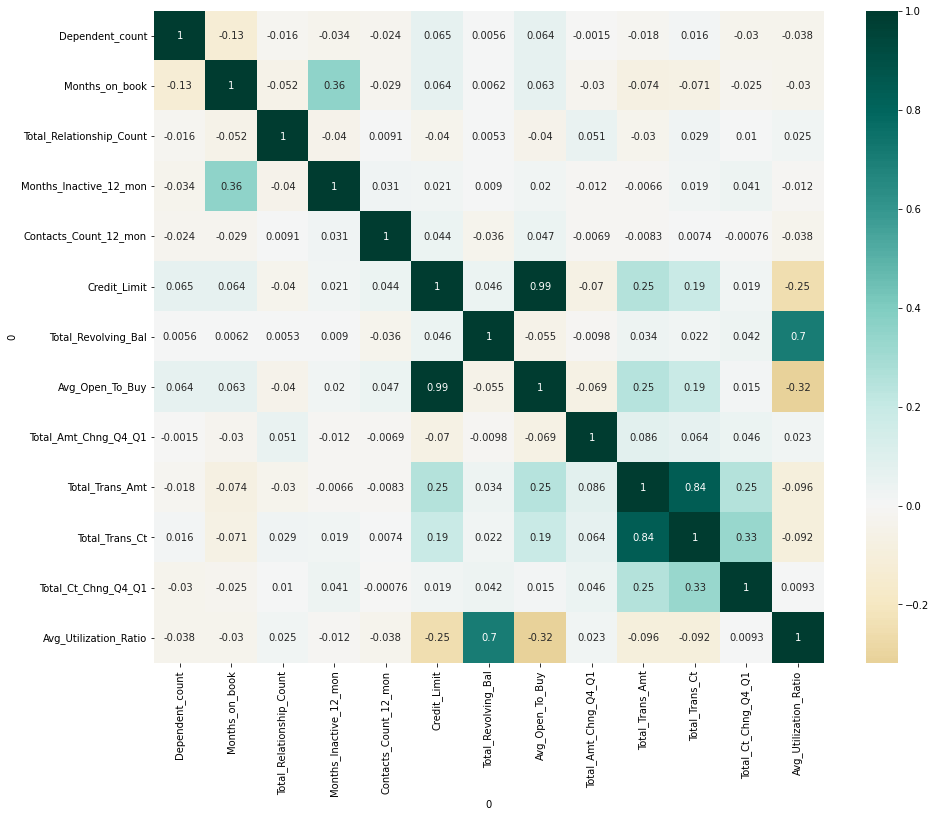

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(df_AC.corr(), annot=True, cmap="BrBG",center=0)

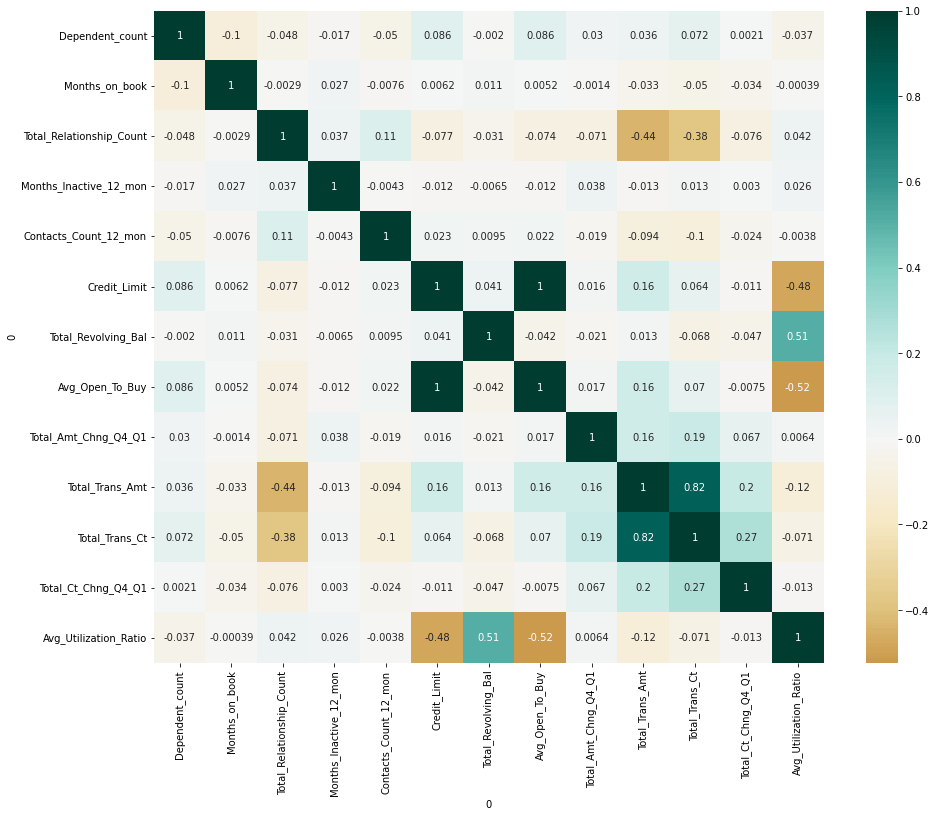

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(df_EC.corr(), annot=True, cmap="BrBG",center=0)

<H2><b>Observations:</b></H2>
<H3><i>Description data</i></H3>
<p>1- 'Total_Revolving_Bal' shows clear outliers (difference between mean and median). Moreover, around 50% of churned customers do not have any credit card spending (50% of percentile).</p>
<p>2- 'Total_Amt_Chng_Q4_Q1' and 'Avg_Utilization_Ratio' show how fell between users who left their services against current once. That is clear looking their lower median and 75-percentile (showing their down over last periods).</p>
<p>3- 'Total_Trans_Amt' and 'Total_Trans_Ct' show how churned customers had decreased their movements (almost half or less on variability and central tendency) than the existing customers.</p>
<H3><i>Correlation data</i></H3>
<p>4- The following columns don't have any overall important relationship over both groups: 'Dependent_count' and 'Contacts_Count_12_mon'.</p>
<p>5- 'Total_Relationship_Count' doesn't represent an important information against churned users over the other side.</p>
<p>6- 'Months_Inactive_12_mon' shows a correlation with customers who left the services.</p>
<p>7- 'Total_Revolving_Bal' and 'Avg_Utilization_Ratio' have a paramount correlation between each other. They can illustrate users who want to leave their services, make an important movement before finishing their relation with the bank.</p>
<p>8- 'Credit_Limit' and 'Avg_Open_To_Buy' go down between both type of users.</p>

In [ ]:
df.drop(['Dependent_count', 'Contacts_Count_12_mon'], axis=1, inplace=True)

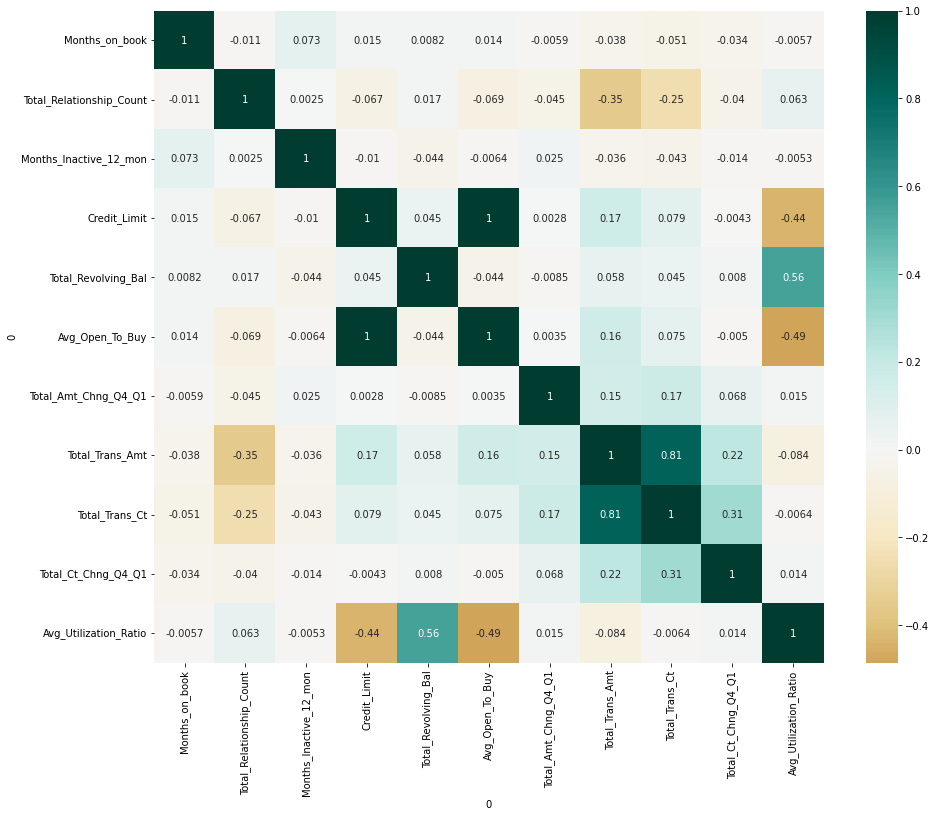

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(df.corr(), annot=True, cmap="BrBG",center=0)

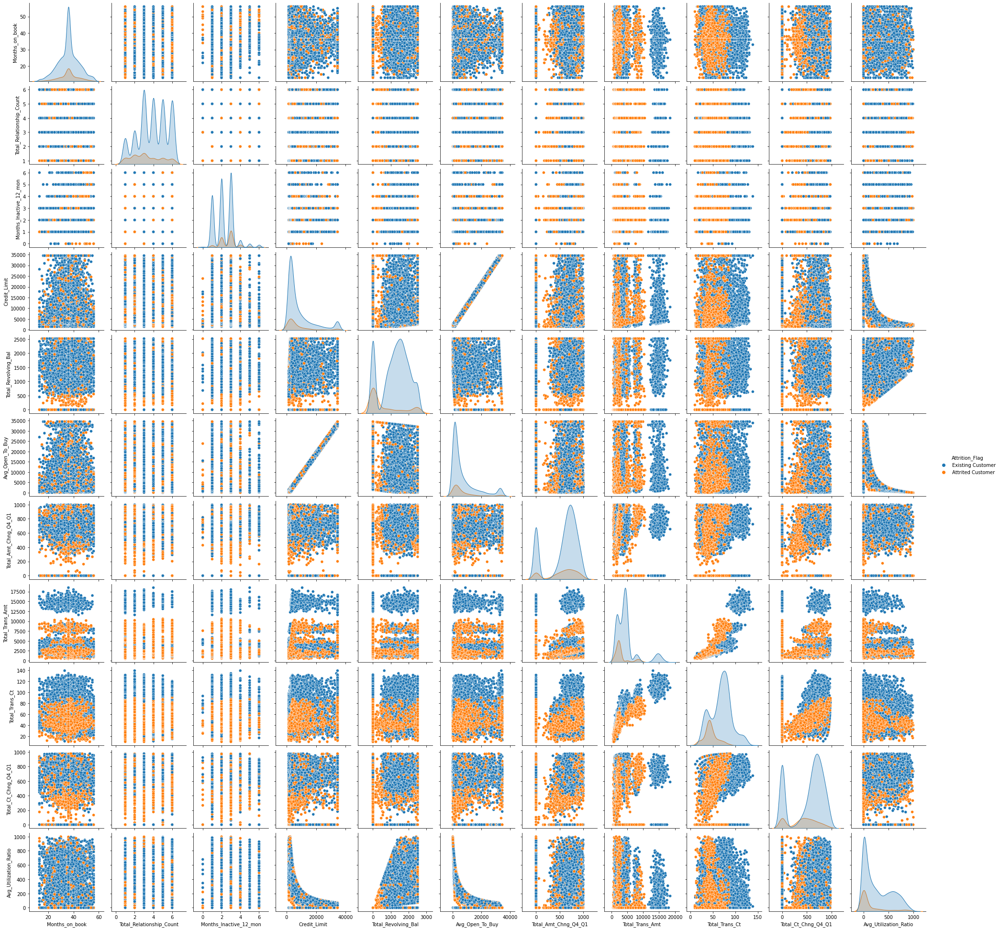

In [ ]:
sns.pairplot(df, hue='Attrition_Flag')

---
# <H2><b>Applying Standardization and Normalization</b></H2>

In [ ]:
df.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Adulthood
0,Existing Customer,M,High School,Married,$60K - $80K,39,5,1,12691.0,777.0,11914.0,1.335,1144.0,42.0,1.625,61.0,middle_adulthood
1,Existing Customer,F,Graduate,Single,Less than $40K,44,6,1,8256.0,864.0,7392.0,1.541,1291.0,33.0,3.714,105.0,middle_adulthood
2,Existing Customer,M,Graduate,Married,$80K - $120K,36,4,1,3418.0,0.0,3418.0,2.594,1887.0,20.0,2.333,0.0,middle_adulthood
3,Existing Customer,M,Uneducated,Married,$60K - $80K,21,5,1,4716.0,0.0,4716.0,2.175,816.0,28.0,2.500,0.0,middle_adulthood
4,Existing Customer,M,Graduate,Married,$40K - $60K,36,3,1,4010.0,1247.0,2763.0,1.376,1088.0,24.0,846.000,311.0,middle_adulthood


In [ ]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
data_scaled = scaler.fit_transform(df[['Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal', 
                                       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 
                                       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']])

data_scaled = pd.DataFrame(data_scaled, columns = ['Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal', 
                            'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 
                            'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'])

data_scaled.head()

,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0.333333,1.028322,-0.382979,1.055731,-2.166661,-1.020110,-0.694444,-1.342063,-0.161111
1,0.888889,0.486907,-0.316869,0.506078,-2.165997,-0.964333,-0.944444,-1.337551,-0.069048
2,0.000000,-0.103705,-0.973404,0.023034,-2.162600,-0.738190,-1.305556,-1.340533,-0.288745
3,-1.666667,0.054752,-0.973404,0.180807,-2.163952,-1.144565,-1.083333,-1.340173,-0.288745
4,0.000000,-0.031435,-0.025836,-0.056582,-2.166529,-1.041358,-1.194444,0.481641,0.361978


In [ ]:
df.drop(['Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal', 
        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 
        'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'], axis=1, inplace=True)

df = df.join(data_scaled)

In [ ]:
df.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Adulthood,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,M,High School,Married,$60K - $80K,5,1,middle_adulthood,0.333333,1.028322,-0.382979,1.055731,-2.166661,-1.020110,-0.694444,-1.342063,-0.161111
1,Existing Customer,F,Graduate,Single,Less than $40K,6,1,middle_adulthood,0.888889,0.486907,-0.316869,0.506078,-2.165997,-0.964333,-0.944444,-1.337551,-0.069048
2,Existing Customer,M,Graduate,Married,$80K - $120K,4,1,middle_adulthood,0.000000,-0.103705,-0.973404,0.023034,-2.162600,-0.738190,-1.305556,-1.340533,-0.288745
3,Existing Customer,M,Uneducated,Married,$60K - $80K,5,1,middle_adulthood,-1.666667,0.054752,-0.973404,0.180807,-2.163952,-1.144565,-1.083333,-1.340173,-0.288745
4,Existing Customer,M,Graduate,Married,$40K - $60K,3,1,middle_adulthood,0.000000,-0.031435,-0.025836,-0.056582,-2.166529,-1.041358,-1.194444,0.481641,0.361978


---
# <H2><b>Encoding</b></H2>

In [ ]:
df.loc[(df['Education_Level']=='High School'),'Education_Level'] = 'High_School'
df.loc[(df['Education_Level']=='Post-Graduate'),'Education_Level'] = 'Post_Graduate'
df.loc[(df['Income_Category']=='$120K +'),'Income_Category'] = '>120K'
df.loc[(df['Income_Category']=='$80K - $120K'),'Income_Category'] = '80K<120K'
df.loc[(df['Income_Category']=='$60K - $80K'),'Income_Category'] = '60K<80K'
df.loc[(df['Income_Category']=='$40K - $60K'),'Income_Category'] = '40K<60K'
df.loc[(df['Income_Category']=='Less than $40K'),'Income_Category'] = '<40K'

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

def oneHotEncoding(df_, column):
    # LabelEncoder
    le = LabelEncoder()
    label_encoding = le.fit_transform(df_[column])
    # OneHotEncoder
    onehot_encoder = OneHotEncoder(sparse=False)
    one_hot_encoding = onehot_encoder.fit_transform(label_encoding.reshape(-1, 1))
    # Crear las columnas con el resultado del encoder
    df_one_hot_encoding = pd.DataFrame(one_hot_encoding, columns=le.classes_, dtype=int)
    # Agregar sufijo
    df_one_hot_encoding = df_one_hot_encoding.add_prefix(column+'_')
    # Unir nuevas columnas al dataset
    df_ = df_.join(df_one_hot_encoding)
    # Eleminar vieja columna del dataset
    df_ = df_.drop([column], axis=1)

    return df_, label_encoding, one_hot_encoding

df, le_Gender, ohe_Gender = oneHotEncoding(df, 'Gender')
df, le_Education_Level, ohe_Education_Level = oneHotEncoding(df, 'Education_Level')
df, le_Income_Category, ohe_Income_Category = oneHotEncoding(df, 'Income_Category')
df, le_Marital_Status, ohe_Marital_Status = oneHotEncoding(df, 'Marital_Status')
df, le_Adulthood, ohe_Adulthood = oneHotEncoding(df, 'Adulthood')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8348 entries, 0 to 8347
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Attrition_Flag                 8348 non-null   object 
 1   Total_Relationship_Count       8348 non-null   int64  
 2   Months_Inactive_12_mon         8348 non-null   int64  
 3   Months_on_book                 8348 non-null   float64
 4   Credit_Limit                   8348 non-null   float64
 5   Total_Revolving_Bal            8348 non-null   float64
 6   Avg_Open_To_Buy                8348 non-null   float64
 7   Total_Amt_Chng_Q4_Q1           8348 non-null   float64
 8   Total_Trans_Amt                8348 non-null   float64
 9   Total_Trans_Ct                 8348 non-null   float64
 10  Total_Ct_Chng_Q4_Q1            8348 non-null   float64
 11  Avg_Utilization_Ratio          8348 non-null   float64
 12  Gender_F                       8348 non-null   i

In [ ]:
df.head()

,Attrition_Flag,Total_Relationship_Count,Months_Inactive_12_mon,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,...,Income_Category_60K<80K,Income_Category_80K<120K,Income_Category_<40K,Income_Category_>120K,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Adulthood_early_adulthood,Adulthood_middle_adulthood,Adulthood_young_old
0,Existing Customer,5,1,0.333333,1.028322,-0.382979,1.055731,-2.166661,-1.020110,-0.694444,...,1,0,0,0,0,1,0,0,1,0
1,Existing Customer,6,1,0.888889,0.486907,-0.316869,0.506078,-2.165997,-0.964333,-0.944444,...,0,0,1,0,0,0,1,0,1,0
2,Existing Customer,4,1,0.000000,-0.103705,-0.973404,0.023034,-2.162600,-0.738190,-1.305556,...,0,1,0,0,0,1,0,0,1,0
3,Existing Customer,5,1,-1.666667,0.054752,-0.973404,0.180807,-2.163952,-1.144565,-1.083333,...,1,0,0,0,0,1,0,0,1,0
4,Existing Customer,3,1,0.000000,-0.031435,-0.025836,-0.056582,-2.166529,-1.041358,-1.194444,...,0,0,0,0,0,1,0,0,1,0


---
# <H2><b>Modeling</b></H2>

<p>Analizing our dataset we can build diverse models. Thus, we will apply the following steps per clustering.</p>


<H3><b>Superviced</b></H3>
<b>Models</b>
<ol>
  <li>Random Forest</li>
  <li>KNN</li>
  <li>Logistic Regression</li>
  <li>SVM</li>
</ol>

<b>Dataset</b>
<ol>
  <li>Modeling without any change</li>
  <li>Modeling resampling dataset (under-sampling)</li>
</ol>

<H3><b>Unsuperviced</b></H3>
<b>Models</b>
<ol>
  <li>Hierarchical Cluster</li>
  <li>K-means</li>
</ol>

<b>Dataset</b>
<ol>
  <li>Modeling without 'Attrition_Flag' column</li>
</ol>

In [ ]:
def converterIntY(y_test):
    y_test[y_test=='Existing Customer'] = 1
    y_test[y_test=='Attrited Customer'] = 0
    return y_test

def converterIntPredictions(predictions):
    predictions[predictions=='Existing Customer'] = 1
    predictions[predictions=='Attrited Customer'] = 0
    return predictions

def converterStrY(y_test):
    y_test[y_test==1] = 'Existing Customer'
    y_test[y_test==0] = 'Attrited Customer'
    return y_test

def converterStrPredictions(predictions):
    predictions[predictions==1] = 'Existing Customer'
    predictions[predictions==0] = 'Attrited Customer'
    return predictions

---
## <H2><b>Superviced Model</b></H2>

### <H2><b>Dataset</b> => Without any change</H2>

In [ ]:
df_s = df.copy()

In [ ]:
from sklearn.model_selection import train_test_split

x = df_s.drop('Attrition_Flag', axis=1).values
y = df_s['Attrition_Flag'].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)
x_train_s, x_test_s, y_train_s, y_test_s = x_train, x_test, y_train, y_test

#### <H3>Random Forest<H3>

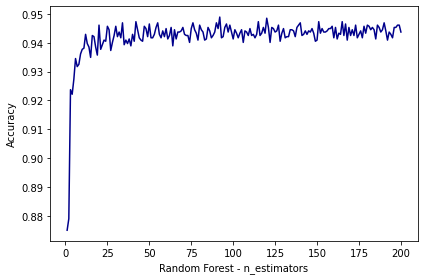


La mejor exactitud (accuracy_score) se obtuvo con 0.95 con n_estimators = 92


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

max_trees = 200
n_trees = np.zeros((max_trees))

for i in range(max_trees):
    rfc = RandomForestClassifier(n_estimators=(i+1), criterion='entropy').fit(x_train, y_train)
    predictions_rfc = rfc.predict(x_test)

    n_trees[i] = accuracy_score(y_test, predictions_rfc)

plt.plot(range(1, max_trees+1), n_trees,'darkBlue')
plt.ylabel('Accuracy')
plt.xlabel('Random Forest - n_estimators')
plt.tight_layout()
plt.show()

print(f"\nLa mejor exactitud (accuracy_score) se obtuvo con {n_trees.max():.2f} con n_estimators = {n_trees.argmax()+1}")

In [ ]:
rfc = RandomForestClassifier(n_estimators=n_trees.argmax()+1, criterion='entropy').fit(x_train, y_train)

predictions_rfc = rfc.predict(x_test)

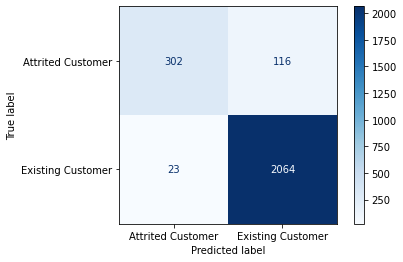



                   precision    recall  f1-score   support

Attrited Customer       0.93      0.72      0.81       418
Existing Customer       0.95      0.99      0.97      2087

         accuracy                           0.94      2505
        macro avg       0.94      0.86      0.89      2505
     weighted avg       0.94      0.94      0.94      2505



In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

cm = confusion_matrix(y_test, predictions_rfc)
cmd = ConfusionMatrixDisplay(cm, display_labels=rfc.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_rfc))

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

y_test = converterIntY(y_test)
predictions_rfc = converterIntPredictions(predictions_rfc)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_rfc))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_rfc))

mean_absolute_error =  0.055489021956087826
mean_squared_error =  0.055489021956087826


In [ ]:
y_test = converterStrY(y_test)
predictions_rfc = converterStrPredictions(predictions_rfc)

#### <H3>KNN</H3>

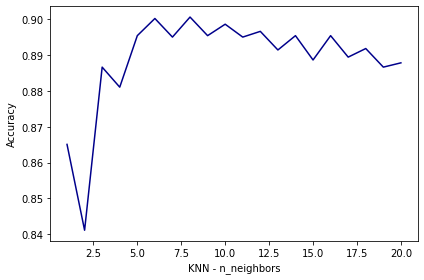


La mejor exactitud se obtuvo con 0.90 con n_neighbors = 8


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

K_MAX = 20
k_n = np.zeros((K_MAX))

for i in range(K_MAX):
    knn = KNeighborsClassifier(n_neighbors=(i+1)).fit(x_train,y_train)
    predictions_knn = knn.predict(x_test)   

    k_n[i] = accuracy_score(y_test, predictions_knn)

plt.plot(range(1, K_MAX+1), k_n,'darkBlue')
plt.ylabel('Accuracy')
plt.xlabel('KNN - n_neighbors')
plt.tight_layout()
plt.show()

print(f"\nLa mejor exactitud se obtuvo con {k_n.max():.2f} con n_neighbors = {k_n.argmax()+1}")

In [ ]:
knn = KNeighborsClassifier(n_neighbors=k_n.argmax()+1).fit(x_train,y_train)
predictions_knn = knn.predict(x_test)

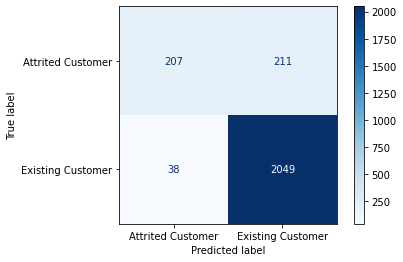



                   precision    recall  f1-score   support

Attrited Customer       0.84      0.50      0.62       418
Existing Customer       0.91      0.98      0.94      2087

         accuracy                           0.90      2505
        macro avg       0.88      0.74      0.78      2505
     weighted avg       0.90      0.90      0.89      2505



In [ ]:
cm = confusion_matrix(y_test, predictions_knn)
cmd = ConfusionMatrixDisplay(cm, display_labels=knn.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_knn))

In [ ]:
y_test = converterIntY(y_test)
predictions_knn = converterIntPredictions(predictions_knn)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_knn))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_knn))

mean_absolute_error =  0.09940119760479042
mean_squared_error =  0.09940119760479042


In [ ]:
y_test = converterStrY(y_test)
predictions_knn = converterStrPredictions(predictions_knn)

#### <H3>Logistic Regression</H3>

In [ ]:
from sklearn.linear_model import LogisticRegression

y_test = converterIntY(y_test)

log_reg = LogisticRegression(solver='sag').fit(x_train, y_train)

predictions_lr = log_reg.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


In [ ]:
y_test = converterStrY(y_test)

accuracy_score(y_test, predictions_lr, normalize=True)

0.8842315369261478

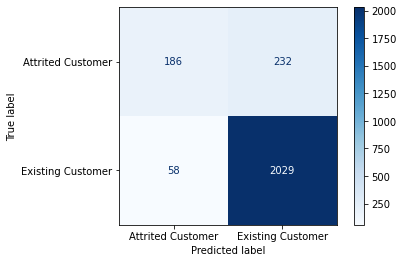



                   precision    recall  f1-score   support

Attrited Customer       0.76      0.44      0.56       418
Existing Customer       0.90      0.97      0.93      2087

         accuracy                           0.88      2505
        macro avg       0.83      0.71      0.75      2505
     weighted avg       0.87      0.88      0.87      2505



In [ ]:
cm = confusion_matrix(y_test, predictions_lr)
cmd = ConfusionMatrixDisplay(cm, display_labels=log_reg.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_lr))

In [ ]:
y_test = converterIntY(y_test)
predictions_lr = converterIntPredictions(predictions_lr)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_lr))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_lr))

mean_absolute_error =  0.1157684630738523
mean_squared_error =  0.1157684630738523


In [ ]:
y_test = converterStrY(y_test)
predictions_lr = converterStrPredictions(predictions_lr)

#### <H3>SVM</H3>

In [ ]:
from sklearn import svm

y_test = converterIntY(y_test).reshape(-1, 1)

svm_poly = svm.SVC(kernel='poly', degree=3).fit(x_train, y_train)

predictions_svm = svm_poly.predict(x_test)

In [ ]:
y_test = converterStrY(y_test)

accuracy_score(y_test, predictions_svm, normalize=True)

0.8994011976047904

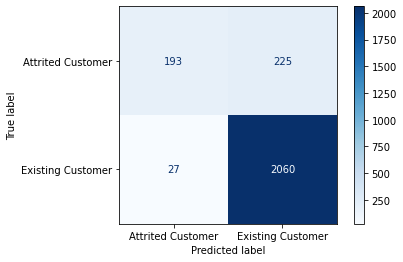



                   precision    recall  f1-score   support

Attrited Customer       0.88      0.46      0.61       418
Existing Customer       0.90      0.99      0.94      2087

         accuracy                           0.90      2505
        macro avg       0.89      0.72      0.77      2505
     weighted avg       0.90      0.90      0.89      2505



In [ ]:
cm = confusion_matrix(y_test, predictions_svm)
cmd = ConfusionMatrixDisplay(cm, display_labels=svm_poly.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test, predictions_svm))

In [ ]:
y_test = converterIntY(y_test)
predictions_svm = converterIntPredictions(predictions_svm)

print('mean_absolute_error = ', mean_absolute_error(y_test, predictions_svm))
print('mean_squared_error = ', mean_squared_error(y_test, predictions_svm))

mean_absolute_error =  0.10059880239520957
mean_squared_error =  0.10059880239520957


In [ ]:
y_test = converterStrY(y_test)
predictions_svm = converterStrPredictions(predictions_svm)

---
### <H2><b>Dataset</b> => under-sampling</H2>

In [ ]:
df_s_AC = df[df['Attrition_Flag']=='Attrited Customer'].copy(deep=True)
df_s_AC['Attrition_Flag'].count()

1328

In [ ]:
df_s_EC = df[df['Attrition_Flag']=='Existing Customer'].copy(deep=True)
df_s_EC['Attrition_Flag'].count()

7020

In [ ]:
df_s_us_EC = df_s_EC.sample(n=2000)

df_s_us = pd.concat([df_s_us_EC, df_s_AC], ignore_index=True)

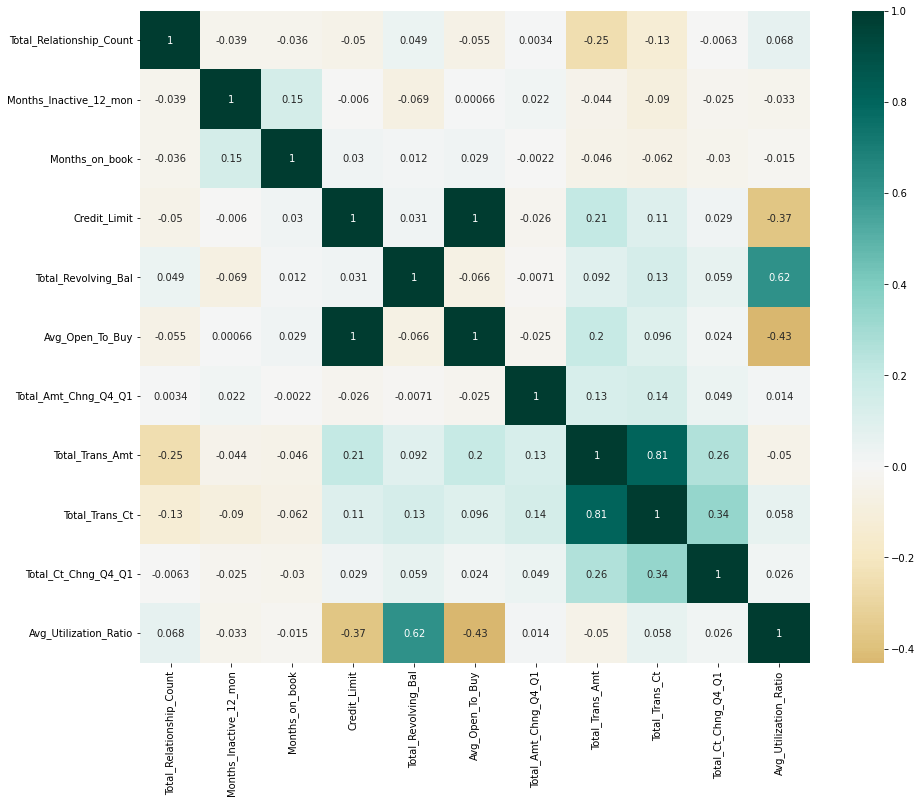

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(df_s_us[['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']].corr(), annot=True, cmap="BrBG",center=0)

In [ ]:
x = df_s_us.drop('Attrition_Flag', axis=1).values
y = df_s_us['Attrition_Flag'].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)
x_train_s_us, x_test_s_us, y_train_s_us, y_test_s_us = x_train, x_test, y_train, y_test

#### <H3>Random Forest<H3>

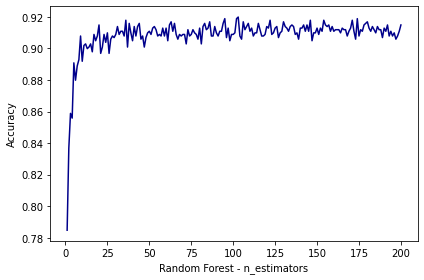


La mejor exactitud (accuracy_score) se obtuvo con 0.92 con n_estimators = 103


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

max_trees = 200
n_trees = np.zeros((max_trees))

for i in range(max_trees):
    rfc_us = RandomForestClassifier(n_estimators=(i+1), criterion='entropy').fit(x_train, y_train)
    predictions_rfc_us = rfc_us.predict(x_test)

    n_trees[i] = accuracy_score(y_test, predictions_rfc_us)

plt.plot(range(1, max_trees+1), n_trees,'darkBlue')
plt.ylabel('Accuracy')
plt.xlabel('Random Forest - n_estimators')
plt.tight_layout()
plt.show()

print(f"\nLa mejor exactitud (accuracy_score) se obtuvo con {n_trees.max():.2f} con n_estimators = {n_trees.argmax()+1}")

In [ ]:
rfc_us = RandomForestClassifier(n_estimators=n_trees.argmax()+1, criterion='entropy').fit(x_train, y_train)

predictions_rfc_us = rfc_us.predict(x_test)

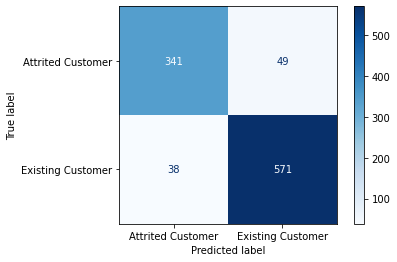



                   precision    recall  f1-score   support

Attrited Customer       0.90      0.87      0.89       390
Existing Customer       0.92      0.94      0.93       609

         accuracy                           0.91       999
        macro avg       0.91      0.91      0.91       999
     weighted avg       0.91      0.91      0.91       999



In [ ]:
cm = confusion_matrix(y_test, predictions_rfc_us)
cmd = ConfusionMatrixDisplay(cm, display_labels=rfc_us.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_rfc_us))

In [ ]:
y_test = converterIntY(y_test)
predictions_rfc_us = converterIntPredictions(predictions_rfc_us)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_rfc_us))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_rfc_us))

mean_absolute_error =  0.08708708708708708
mean_squared_error =  0.08708708708708708


In [ ]:
y_test = converterStrY(y_test)
predictions_rfc_us = converterStrPredictions(predictions_rfc_us)

#### <H3>KNN</H3>

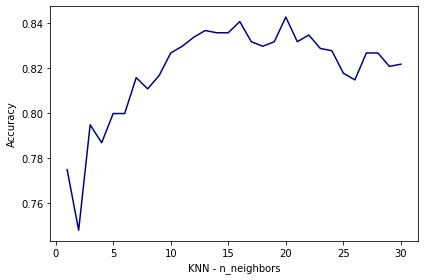


La mejor exactitud se obtuvo con 0.84 con n_neighbors = 20


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

K_MAX = 30
k_n = np.zeros((K_MAX))

for i in range(K_MAX):
    knn_us = KNeighborsClassifier(n_neighbors=(i+1)).fit(x_train,y_train)
    predictions_knn_us = knn_us.predict(x_test)   

    k_n[i] = accuracy_score(y_test, predictions_knn_us)

plt.plot(range(1, K_MAX+1), k_n,'darkBlue')
plt.ylabel('Accuracy')
plt.xlabel('KNN - n_neighbors')
plt.tight_layout()
plt.show()

print(f"\nLa mejor exactitud se obtuvo con {k_n.max():.2f} con n_neighbors = {k_n.argmax()+1}")

In [ ]:
knn_us = KNeighborsClassifier(n_neighbors=k_n.argmax()+1).fit(x_train,y_train)
predictions_knn_us = knn_us.predict(x_test)

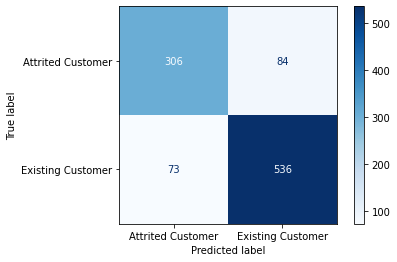



                   precision    recall  f1-score   support

Attrited Customer       0.81      0.78      0.80       390
Existing Customer       0.86      0.88      0.87       609

         accuracy                           0.84       999
        macro avg       0.84      0.83      0.83       999
     weighted avg       0.84      0.84      0.84       999



In [ ]:
cm = confusion_matrix(y_test, predictions_knn_us)
cmd = ConfusionMatrixDisplay(cm, display_labels=knn_us.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_knn_us))

In [ ]:
y_test = converterIntY(y_test)
predictions_knn_us = converterIntPredictions(predictions_knn_us)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_knn_us))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_knn_us))

mean_absolute_error =  0.15715715715715717
mean_squared_error =  0.15715715715715717


In [ ]:
y_test = converterStrY(y_test)
predictions_knn_us = converterStrPredictions(predictions_knn_us)

#### <H3>Logistic Regression</H3>

In [ ]:
from sklearn.linear_model import LogisticRegression

y_test = converterIntY(y_test)

log_reg_us = LogisticRegression(solver='sag').fit(x_train, y_train)

predictions_lr_us = log_reg_us.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


In [ ]:
y_test = converterStrY(y_test)

accuracy_score(y_test, predictions_lr_us, normalize=True)

0.8068068068068068

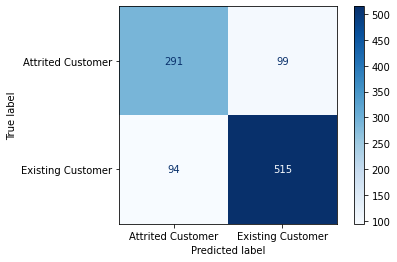



                   precision    recall  f1-score   support

Attrited Customer       0.76      0.75      0.75       390
Existing Customer       0.84      0.85      0.84       609

         accuracy                           0.81       999
        macro avg       0.80      0.80      0.80       999
     weighted avg       0.81      0.81      0.81       999



In [ ]:
cm = confusion_matrix(y_test, predictions_lr_us)
cmd = ConfusionMatrixDisplay(cm, display_labels=log_reg_us.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test,predictions_lr_us))

In [ ]:
y_test = converterIntY(y_test)
predictions_lr_us = converterIntPredictions(predictions_lr_us)

print('mean_absolute_error = ', mean_absolute_error(y_test,predictions_lr_us))
print('mean_squared_error = ', mean_squared_error(y_test,predictions_lr_us))

mean_absolute_error =  0.1931931931931932
mean_squared_error =  0.1931931931931932


In [ ]:
y_test = converterStrY(y_test)
predictions_lr_us = converterStrPredictions(predictions_lr_us)

#### <H3>SVM</H3>

In [ ]:
from sklearn import svm

y_test = converterIntY(y_test).reshape(-1, 1)

svm_poly_us = svm.SVC(kernel='poly', degree=3).fit(x_train, y_train)

predictions_svm_us = svm_poly_us.predict(x_test)

In [ ]:
y_test = converterStrY(y_test)

accuracy_score(y_test, predictions_svm_us, normalize=True)

0.8498498498498499

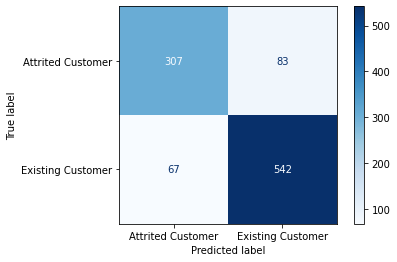



                   precision    recall  f1-score   support

Attrited Customer       0.82      0.79      0.80       390
Existing Customer       0.87      0.89      0.88       609

         accuracy                           0.85       999
        macro avg       0.84      0.84      0.84       999
     weighted avg       0.85      0.85      0.85       999



In [ ]:
cm = confusion_matrix(y_test, predictions_svm_us)
cmd = ConfusionMatrixDisplay(cm, display_labels=svm_poly_us.classes_)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y_test, predictions_svm_us))

In [ ]:
y_test = converterIntY(y_test)
predictions_svm_us = converterIntPredictions(predictions_svm_us)

print('mean_absolute_error = ', mean_absolute_error(y_test, predictions_svm_us))
print('mean_squared_error = ', mean_squared_error(y_test, predictions_svm_us))

mean_absolute_error =  0.15015015015015015
mean_squared_error =  0.15015015015015015


In [ ]:
y_test = converterStrY(y_test)
predictions_svm_us = converterStrPredictions(predictions_svm_us)

---
## <H2><b>Unsuperviced Model</b></H2>

In [ ]:
df_us = df.copy()

In [ ]:
x = df_us.drop('Attrition_Flag', axis=1).values
y_test_us = df_us['Attrition_Flag'].values

### <H3>Hierarchical Cluster</H3>

In [ ]:
from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters=2)
predictions_hc = hc.fit_predict(x)

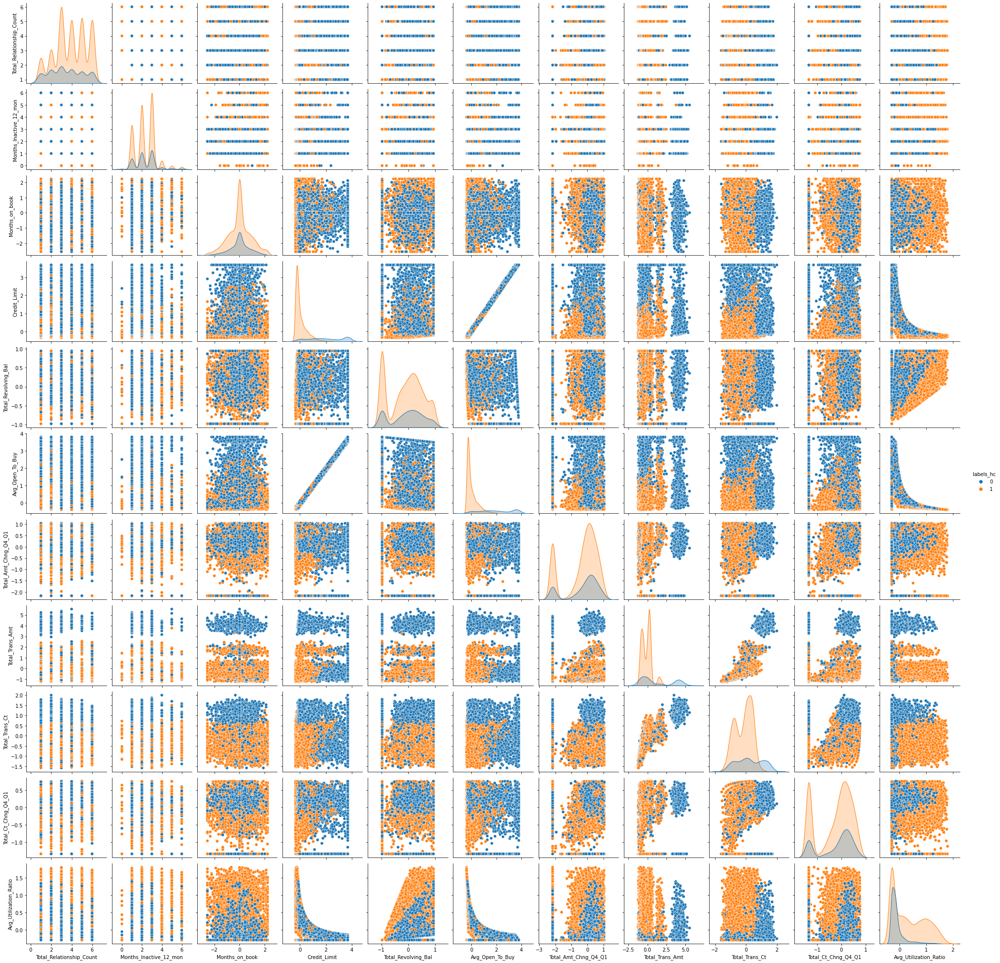

In [ ]:
x_df = pd.DataFrame(x, columns=['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender_F', 'Gender_M', 'Education_Level_College',
       'Education_Level_Doctorate', 'Education_Level_Graduate',
       'Education_Level_High_School', 'Education_Level_Post_Graduate',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Income_Category_40K<60K', 'Income_Category_60K<80K',
       'Income_Category_80K<120K', 'Income_Category_<40K',
       'Income_Category_>120K', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Adulthood_early_adulthood', 'Adulthood_middle_adulthood',
       'Adulthood_young_old'])
x_df = x_df.drop(['Gender_F', 'Gender_M', 'Education_Level_College',
       'Education_Level_Doctorate', 'Education_Level_Graduate',
       'Education_Level_High_School', 'Education_Level_Post_Graduate',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Income_Category_40K<60K', 'Income_Category_60K<80K',
       'Income_Category_80K<120K', 'Income_Category_<40K',
       'Income_Category_>120K', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Adulthood_early_adulthood', 'Adulthood_middle_adulthood',
       'Adulthood_young_old'], axis=1)

predictions_hc_df = pd.DataFrame(predictions_hc, columns=['labels_hc'])

x_df = x_df.join(predictions_hc_df)

sns.pairplot(x_df, hue='labels_hc')

In [ ]:
y_test_us_hc = pd.DataFrame(y_test_us, columns=['Attrition_Flag'])

y_test_us_hc = y_test_us_hc.join(predictions_hc_df)
y_test_us_hc.head(n=1)

,Attrition_Flag,labels_hc
0,Existing Customer,1


In [ ]:
y_test_us_hc['Attrition_Flag'] = converterIntY(y_test_us_hc['Attrition_Flag'])
y_test_us_hc.head(n=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Attrition_Flag,labels_hc
0,1,1


Accuracy =>  0.6637517968375659




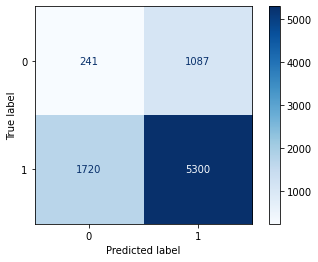



              precision    recall  f1-score   support

           0       0.12      0.18      0.15      1328
           1       0.83      0.75      0.79      7020

    accuracy                           0.66      8348
   macro avg       0.48      0.47      0.47      8348
weighted avg       0.72      0.66      0.69      8348



In [ ]:
y1 = y_test_us_hc['Attrition_Flag'].astype(int).to_numpy()
y2 = y_test_us_hc['labels_hc'].astype(int).to_numpy()

print('Accuracy => ', accuracy_score(y1, y2, normalize=True))
print('\n')

cm = confusion_matrix(y1, y2)
cmd = ConfusionMatrixDisplay(cm)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y1, y2))

# 1 = Customer // 0 = No Customer => tru label or y_test_us

### <H3>K-means</H3>

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2, init='k-means++', random_state=0)
kmeans.fit(x)

predictions_km = kmeans.predict(x)

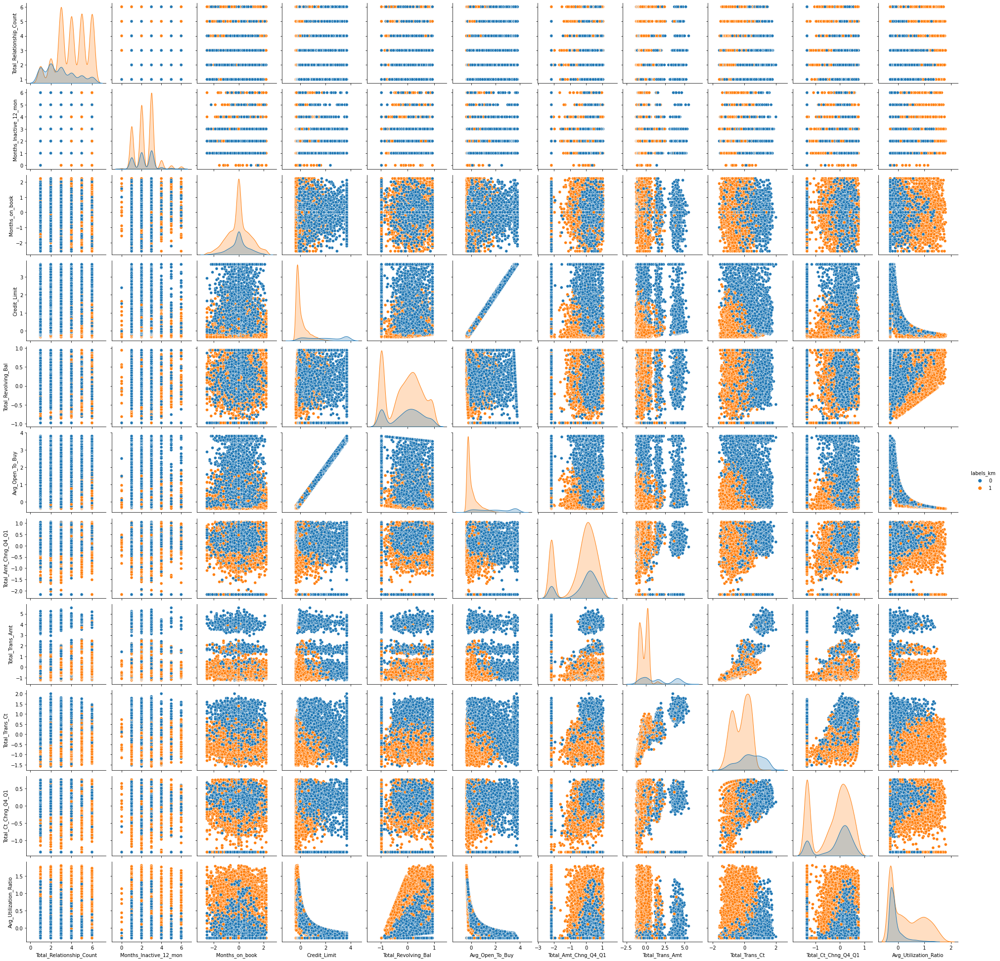

In [ ]:
x_df = pd.DataFrame(x, columns=['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender_F', 'Gender_M', 'Education_Level_College',
       'Education_Level_Doctorate', 'Education_Level_Graduate',
       'Education_Level_High_School', 'Education_Level_Post_Graduate',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Income_Category_40K<60K', 'Income_Category_60K<80K',
       'Income_Category_80K<120K', 'Income_Category_<40K',
       'Income_Category_>120K', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Adulthood_early_adulthood', 'Adulthood_middle_adulthood',
       'Adulthood_young_old'])
x_df = x_df.drop(['Gender_F', 'Gender_M', 'Education_Level_College',
       'Education_Level_Doctorate', 'Education_Level_Graduate',
       'Education_Level_High_School', 'Education_Level_Post_Graduate',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Income_Category_40K<60K', 'Income_Category_60K<80K',
       'Income_Category_80K<120K', 'Income_Category_<40K',
       'Income_Category_>120K', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Adulthood_early_adulthood', 'Adulthood_middle_adulthood',
       'Adulthood_young_old'], axis=1)

predictions_km_df = pd.DataFrame(predictions_km, columns=['labels_km'])

x_df = x_df.join(predictions_km_df)

sns.pairplot(x_df, hue='labels_km')

In [ ]:
y_test_us_km = pd.DataFrame(y_test_us, columns=['Attrition_Flag'])

y_test_us_km = y_test_us_km.join(predictions_hc_df)
y_test_us_km.head(n=1)

,Attrition_Flag,labels_hc
0,Existing Customer,1


In [ ]:
y_test_us_km['Attrition_Flag'] = converterIntY(y_test_us_km['Attrition_Flag'])
y_test_us_km.head(n=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Attrition_Flag,labels_hc
0,1,1


Accuracy =>  0.6637517968375659




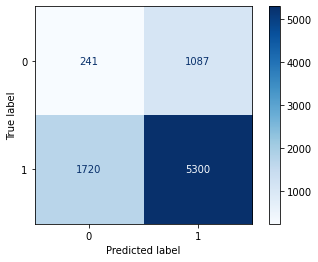



              precision    recall  f1-score   support

           0       0.12      0.18      0.15      1328
           1       0.83      0.75      0.79      7020

    accuracy                           0.66      8348
   macro avg       0.48      0.47      0.47      8348
weighted avg       0.72      0.66      0.69      8348



In [ ]:
y1 = y_test_us_km['Attrition_Flag'].astype(int).to_numpy()
y2 = y_test_us_km['labels_hc'].astype(int).to_numpy()

print('Accuracy => ', accuracy_score(y1, y2, normalize=True))
print('\n')

cm = confusion_matrix(y1, y2)
cmd = ConfusionMatrixDisplay(cm)
cmd.plot(cmap=plt.cm.Blues)
plt.show()

print('\n')
print(classification_report(y1, y2))

# 1 = Customer // 0 = No Customer => tru label or y_test_us

<table>
<thead>
  <tr>
    <th></th>
    <th>Random Forest</th>
    <th>KNN</th>
    <th>Logistic Regression</th>
    <th>SVM</th>
    <th>Hierarchical Cluster</th>
    <th>K-means</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>accuracy<br>( (TP+TN)/(Total) )</td>
    <td>0.95<br>n_estimator=92</td>
    <td>0.90<br>n_neighbors=8</td>
    <td>0.884</td>
    <td>0.899</td>
    <td>0.664</td>
    <td>0.664</td>
  </tr>
  <tr>
    <td>MAE</td>
    <td>0.055</td>
    <td>0.099</td>
    <td>0.116</td>
    <td>0.101</td>
    <td>-</td>
    <td>-</td>
  </tr>
  <tr>
    <td>Precision<br>( TP/(TP+FP) )</td>
    <td>No customer=0.93<br>Customer=0.95</td>
    <td>No customer=0.84<br>Customer=0.91</td>
    <td>No customer=0.76<br>Customer=0.90</td>
    <td>No customer=0.88<br>Customer=0.90</td>
    <td>No customer=0.12<br>Customer=0.83</td>
    <td>No customer=0.12<br>Customer=0.83</td>
  </tr>
  <tr>
    <td>Recall<br>( TP/(TP+FN) )</td>
    <td>No customer=0.72<br>Customer=0.99</td>
    <td>No customer=0.50<br>Customer=0.98</td>
    <td>No customer=0.44<br>Customer=0.97</td>
    <td>No customer=0.46<br>Customer=0.99</td>
    <td>No customer=0.18<br>Customer=0.75</td>
    <td>No customer=0.18<br>Customer=0.75</td>
  </tr>
  <tr>
    <td>F1 score</td>
    <td>No customer=0.81<br>Customer=0.97</td>
    <td>No customer=0.62<br>Customer=0.94</td>
    <td>No customer=0.56<br>Customer=0.93</td>
    <td>No customer=0.61<br>Customer=0.94</td>
    <td>No customer=0.15<br>Customer=0.79</td>
    <td>No customer=0.15<br>Customer=0.79</td>
  </tr>
  <tr>
    <td>accuracy<br>(under-sampling)</td>
    <td>0.92<br>n_estimators=103</td>
    <td>0.84<br>n_neighbors=20</td>
    <td>0.807</td>
    <td>0.85</td>
    <td>-</td>
    <td>-</td>
  </tr>
  <tr>
    <td>MAE<br>(under-sampling)</td>
    <td>0.087</td>
    <td>0.157</td>
    <td>0.193</td>
    <td>0.150</td>
    <td>-</td>
    <td>-</td>
  </tr>
  <tr>
    <td>Precision<br>( TP/(TP+FP) )<br>(under-sampling)</td>
    <td>No customer=0.90<br>Customer=0.92</td>
    <td>No customer=0.81<br>Customer=0.86</td>
    <td>No customer=0.76<br>Customer=0.84</td>
    <td>No customer=0.82<br>Customer=0.87</td>
    <td>-</td>
    <td>-</td>
  </tr>
  <tr>
    <td>Recall<br>( TP/(TP+FN) )<br>(under-sampling)</td>
    <td>No customer=0.87<br>Customer=0.94</td>
    <td>No customer=0.78<br>Customer=0.88</td>
    <td>No customer=0.75<br>Customer=0.85</td>
    <td>No customer=0.79<br>Customer=0.89</td>
    <td>-</td>
    <td>-</td>
  </tr>
  <tr>
    <td>F1 score<br>(under-sampling)</td>
    <td>No customer=0.89<br>Customer=0.93</td>
    <td>No customer=0.80<br>Customer=0.87</td>
    <td>No customer=0.75<br>Customer=0.84</td>
    <td>No customer=0.80<br>Customer=0.88</td>
    <td>-</td>
    <td>-</td>
  </tr>
</tbody>
</table>

<H2><b>Observations:</b></H2>

<p>We applied diverse Machine Learning (ML) techniques to make analysis between their results. On one hand, supervised model with Random Forest, KNN and Logistic Regression to have a predictive model to, I. predict future customer who abandon the servicies, and II. a confution matrix to have posible customers who currently can abandon the servicies (as the result of the correlation of all data). On the other hand, unsupervised models to recognize if we have clear division between the customers (without the label 'Attrition_Flag').</p>

<p>Analysing the table above, the best model is Random Forest without applying under-sampling. From this conclusion, we should look at their information from the confusion matrix.</p> 

---
# <H2><b>Conclusions</b></H2>

<p>A 93% of accuracy of churned customers regarding Random Forest Model will give us the accuracy of our observations around them. First, 23 customers are possible to abandon the services. Thus, they have to be the beginning who the bank should apply marketing techniques to keep them. Secondly, 116 customers who abandoned the bank can be influenced to come back if the bank will promote with new services or products.</p>

<p>These conclusions are around a 95% of accuracy with possible desviations. Nevertheless, it is recommendable to get more data to turn balanced whether it is possible.</p>

# <H2><b>Download our model</b></H2>

In [ ]:
# import pickle

# pickle.dump(rfc, open('bankChurners.pkl','wb'))

<p>To use this model, we have to use the next lines in our app.</p>

<p><b>Notes:</b> The user give the data as the beginning we worked (without any change, for example 'age' we changed from number to categorical). For that reason before predict our result, we must make the same changes.</p>

<p>The following information the only way to obtain them is to convert to the correct format each features.To do this, we have to analize, after creating our model, how our program changed them and apply that in our program.</p>

<p>['Gender_F', 'Gender_M']</p>

<p>['Education_Level_College', 'Education_Level_Doctorate', 'Education_Level_Graduate', 'Education_Level_High_School', 'Education_Level_Post_Graduate', 'Education_Level_Uneducated', 'Education_Level_Unknown']</p>

<p>['Income_Category_40K<60K', 'Income_Category_60K<80K', 'Income_Category_80K<120K', 'Income_Category_<40K', 'Income_Category_>120K']</p>

<p>['Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Single']</p>

<p>['Adulthood_early_adulthood', 'Adulthood_middle_adulthood', 'Adulthood_young_old']</p>

In [ ]:
# import pickle

# model = pickle.load(open('bankChurners.pkl','rb'))

# feactures = np.array(['Total_Relationship_Count', 'Months_Inactive_12_mon',
#        'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal',
#        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
#        'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
#        'Gender_F', 'Gender_M', 'Education_Level_College',
#        'Education_Level_Doctorate', 'Education_Level_Graduate',
#        'Education_Level_High_School', 'Education_Level_Post_Graduate',
#        'Education_Level_Uneducated', 'Education_Level_Unknown',
#        'Income_Category_40K<60K', 'Income_Category_60K<80K',
#        'Income_Category_80K<120K', 'Income_Category_<40K',
#        'Income_Category_>120K', 'Marital_Status_Divorced',
#        'Marital_Status_Married', 'Marital_Status_Single',
#        'Adulthood_early_adulthood', 'Adulthood_middle_adulthood',
#        'Adulthood_young_old'])

# prediction = model.predict(feactures)

# output = prediction[0]